In [1]:
from huggingface_hub import login
login(token="your_token")

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: fineGrained).
Your token has been saved to /home/likunjun/.cache/huggingface/token
Login successful


In [2]:
import torch
import torch.nn as nn
import pandas as pd
from torch.utils.data import DataLoader, Dataset
from diffusers import StableDiffusion3Pipeline
import logging
import time
from typing import Any, Dict, List, Optional, Union

from quant import Quantizer
from sparsegpt import SparseGPT
from modelutils import find_layers

try:
    import wandb
    has_wandb = True
except ImportError:
    has_wandb = False

In [3]:
class TextPromptDataset(Dataset):
    def __init__(self, prompts, max_length=75):
        self.prompts = prompts
        self.max_length = max_length

    def __len__(self):
        return len(self.prompts)

    def __getitem__(self, idx):
        prompt = self.prompts[idx]
        return prompt

In [4]:
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

In [5]:
def load_stable_diffusion_pipeline(model_path, device):
    logger.info('Loading Stable Diffusion model...')
    try:
        pipeline = StableDiffusion3Pipeline.from_single_file(
            model_path,
            torch_dtype=torch.float16
        ).to(device)
        logger.info('Pipeline loaded and moved to device')
        return pipeline
    except Exception as e:
        logger.error(f"Error loading model: {e}")
        raise e


In [6]:
@torch.no_grad()
def sd_sequential(pipeline, dataloader, dev, nsamples):
    dtype = torch.float16

    # Initialize input caches
    hidden_states_cache = torch.zeros(
        (nsamples, 2, 4096, 1536),
        dtype=dtype, device=dev
    )
    
    encoder_hidden_states_cache = torch.zeros(
        (nsamples, 2, 333, 1536),
        dtype=dtype, device=dev
    )

    temb_cache = torch.zeros(
        (nsamples, 2, 1536),  # Corrected the shape
        dtype=dtype, device=dev
    )

    cache_index = 0

    class Catcher(nn.Module):
        def __init__(self, module):
            super().__init__()
            self.module = module

        def forward(self, hidden_states: torch.FloatTensor, encoder_hidden_states: torch.FloatTensor, temb: torch.FloatTensor):
            nonlocal cache_index
            if cache_index < nsamples:
                hidden_states_cache[cache_index] = hidden_states
                if encoder_hidden_states is not None:
                    encoder_hidden_states_cache[cache_index] = encoder_hidden_states
                temb_cache[cache_index] = temb
                cache_index += 1
            raise ValueError

    # Replace the first transformer block with the Catcher
    pipeline.transformer.transformer_blocks[0] = Catcher(pipeline.transformer.transformer_blocks[0])

    logger.info('Processing data batches...')
    processed_samples = 0
    for batch in dataloader:
        if processed_samples >= nsamples:
            break
        try:
            # Process the prompt through the pipeline
            prompt = batch[0]
            processed_samples += 1
            pipeline(prompt)
        except ValueError:
            pass

    # Restore the original transformer block
    pipeline.transformer.transformer_blocks[0] = pipeline.transformer.transformer_blocks[0].module
    pipeline = pipeline.to('cpu')
    torch.cuda.empty_cache()

    hidden_outs = torch.zeros_like(hidden_states_cache)
    encoder_outs = torch.zeros_like(encoder_hidden_states_cache)

    logger.info('Ready')

    # Loop through transformer blocks and perform operations
    for i, block in enumerate(pipeline.transformer.transformer_blocks):
        logger.info(f'Processing block {i}')
        block = block.to(dev)
        subset = find_layers(block)
        gpts = {name: SparseGPT(subset[name]) for name in subset}

        # Configure quantizer if needed
        for name in gpts:
            if args.wbits < 16:
                gpts[name].quantizer = Quantizer()
                gpts[name].quantizer.configure(args.wbits, perchannel=True, sym=False, mse=False)

        def add_batch(name):
            def tmp(_, inp, out):
                gpts[name].add_batch(inp[0].data, out.data)
                logger.info(f'Adding batch for layer {name}')
            return tmp

        # Register hooks
        handles = [subset[name].register_forward_hook(add_batch(name)) for name in gpts]

        try:
            # Process inputs through the layer
            for j in range(nsamples):
                hidden_states = hidden_states_cache[j].squeeze(0)
                encoder_hidden_states = encoder_hidden_states_cache[j].squeeze(0) if encoder_hidden_states_cache[j] is not None else None
                temb = temb_cache[j].squeeze(0)

                # encoder_hidden_states, hidden_states = block(
                #     hidden_states=hidden_states,
                #     encoder_hidden_states=encoder_hidden_states,
                #     temb=temb
                # )

                # hidden_outs[j] = hidden_states
                # if encoder_hidden_states is not None:
                #     encoder_outs[j] = encoder_hidden_states
                
                #test, delete later
                block(
                    hidden_states=hidden_states,
                    encoder_hidden_states=encoder_hidden_states,
                    temb=temb
                )

        except Exception as e:
            logger.error(f"Error processing inputs through block {i}, sample {j}: {e}")
            raise e

        for h in handles:
            h.remove()

        # Pruning
        try:
            for name in gpts:
                sparsity = args.sparsity
                logger.info(f'Pruning layer {name} with sparsity {sparsity}')
                gpts[name].fasterprune(sparsity, prunen=args.prunen, prunem=args.prunem, percdamp=args.percdamp, blocksize=args.blocksize)
                gpts[name].free()
        except Exception as e:
            logger.error(f"Error pruning layer {name} in block {i}: {e}")
            raise e

        try:
            # Process inputs again through the layer
            for j in range(nsamples):
                # hidden_states = hidden_outs[j].squeeze(0)
                # encoder_hidden_states = encoder_outs[j].squeeze(0) if encoder_outs[j] is not None else None
                # temb = temb_cache[j].squeeze(0)

                # encoder_hidden_states, hidden_states = block(
                #     hidden_states=hidden_states,
                #     encoder_hidden_states=encoder_hidden_states,
                #     temb=temb
                # )

                # hidden_outs[j] = hidden_states
                # if encoder_hidden_states is not None:
                #     encoder_outs[j] = encoder_hidden_states

                hidden_states = hidden_states_cache[j].squeeze(0)
                encoder_hidden_states = encoder_hidden_states_cache[j].squeeze(0) if encoder_hidden_states_cache[j] is not None else None
                temb = temb_cache[j].squeeze(0)

                encoder_hidden_states, hidden_states = block(
                    hidden_states=hidden_states,
                    encoder_hidden_states=encoder_hidden_states,
                    temb=temb
                )

                hidden_outs[j] = hidden_states
                if encoder_hidden_states is not None:
                    encoder_outs[j] = encoder_hidden_states

        except Exception as e:
            logger.error(f"Error re-processing inputs through block {i}, sample {j}: {e}")
            raise e

        pipeline.transformer.transformer_blocks[i] = block.cpu()
        del block
        torch.cuda.empty_cache()

        hidden_states_cache, hidden_outs = hidden_outs, hidden_states_cache
        encoder_hidden_states_cache, encoder_outs = encoder_outs, encoder_hidden_states_cache

    torch.cuda.empty_cache()
    logger.info('Pruning completed.')


In [7]:
if __name__ == '__main__':
    class Args:
        dataset = 'laion'
        seed = 0
        nsamples = 256
        percdamp = 0.01
        sparsity = 0.5
        prunen = 2
        prunem = 4
        blocksize = 128
        gmp = False
        wbits = 16
        minlayer = -1
        maxlayer = 1000
        prune_only = ''
        invert = False
        save = 'pruned_sd3_model'
        log_wandb = False

    args = Args()

    if args.log_wandb:
        assert has_wandb, "wandb not installed, try `pip install wandb`"
        wandb.init(config=args)

    # Load text prompts from a TSV file
    df = pd.read_csv('laion/labels.tsv', sep='\t', header=None, names=['image_id', 'text', 'score', 'url'], on_bad_lines='skip')
    text_prompts = df['text'].tolist()

    dataset = TextPromptDataset(text_prompts)
    dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    pipeline = load_stable_diffusion_pipeline('sd3_medium_incl_clips_t5xxlfp16.safetensors', device)


INFO:__main__:Loading Stable Diffusion model...


Fetching 21 files:   0%|          | 0/21 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers
INFO:__main__:Pipeline loaded and moved to device


In [8]:
    sd_sequential(pipeline, dataloader, device, args.nsamples)

INFO:__main__:Processing data batches...


  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (107 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['them, mr ramnath, rowing across the river yamuna near the red fort at sunset. ( photo by saurabh narang / the guardian )']
Token indices sequence length is longer than the specified maximum sequence length for this model (107 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['them, mr ramnath, rowing across the river yamuna near the red fort at sunset. ( photo by saurabh narang / the guardian )']


  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['(@ natmus _ swe ) stockholm, sweden https :// t. co / zyovmwpf 2 h']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['(@ natmus _ swe ) stockholm, sweden https :// t. co / zyovmwpf 2 h']


  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['6 in 1 uzgxvjesytmd 4 fx _ e 1 8 wclcbgas / s 1 6 0 0 / 1 1 % 2 btopiary % 2 bgarden % 2 b % 2 bby % 2 bsimon % 2 bgarden -% 2 boil % 2 bon % 2 bpanel % 2 5 2 c % 2 b 2 0 1 7 % 2 b -% 2 b 5 0 0 px. jpg minus 5 7 1 4 7 4 7 0 5 6 8 9 2 4 9 5 4 9 4 designart mysterious fairytale green wood landscape photography canvas print 6. 5 0 9 2 0 8 6 7 9 1 9 9 2 1 9 https :// s 7 d 9. scene 7. com / is / image / jcpenney / dp 1 0 2 1 2 0 1 7 0 8 5 0 3 3 4 0 m? hei = 3 8 0 & amp ; amp ; wid = 3 8 0 & amp ; op _ usm =. 4,. 8, 0, 0 & amp ; resmode = sharp 2 minus 1 3 3 5 2 1 9 4 2 8 9 9 1 7 6 0 7 0 0. jpg watercolor sketch or illustration of a traditional yellow tram on a street in lisbon in portugal. reklamní fotografie - 1 2 4 5 6 0 5 4 2 6. 6 3 6 3 5 8 2 6 1 1 0 8 3 9 8 https :// us. 1 2 3 rf. com / 4 5 0 wm / franz 1 2 / franz 1 2 1 9 0 6 / franz 1 2 1 9 0 6 0 0 1 1 5 / 1 2 4 5 6 0 5 4 2 - wate

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["plants and amazing creatures. the journey culminates in an encounter with a na'vi shaman, who has a deep connection to the life force of pandora and sends positive energy out into the forest through her music. na'vi river journey will open with pandora – the world of avatar in 2 0 1 7. disney's animal kingdom is one of four theme parks at walt disney world resort in lake buena vista, fla. ( disney )"]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["plants and amazing creatures. the journey culminates in an encounter with a na'vi shaman, who has a deep connection to the life force of pandora and sends positive energy out into the forest through her music. na'vi river journey will open with pandora – the world of avatar in 2 0 1 7. disney's animal kingdom is one of four theme parks at walt disney world resort in lake buena vista

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['- blue - gray emphasize this... a shadow - reader, escaping - pain? bordeom?"" crescent dragonwagon\'s writing, cooking, & workshops "']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['- blue - gray emphasize this... a shadow - reader, escaping - pain? bordeom?"" crescent dragonwagon\'s writing, cooking, & workshops "']


  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['and botanical gardens.']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['and botanical gardens.']


  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['in by the mystery of a fine art example such as this. as we move deeper and deeper into what this piece really means to us, we can find ourselves moving into another era. available as t - shirts, wall art, or interior décor products..< br /> < br /> buy this print at < br /> < br /> fine art america < br /> english < br /> https :// janke. pixels. com / featured / old - timers - with - airplane - jan - keteleer. html < br /> < br /> < br /> wadm / oh my prints < br /> dutch / french / german < br /> https :// www. werkaandemuur. nl / nl / shopwerk / retro --- klassiek - old - timer - auto - s - met - vertrekkend - vliegtuig / 4 3 8 9 4 8 / 1 3 4']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['in by the mystery of a fine art example such as this. as we move deeper and deeper into what this piece really means to us, we can fin

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

Pipelines loaded with `dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, du

time 1.31
error 0.12113586068153381


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.48
error 0.3869799077510834


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.44
error 4389.9931640625


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 6467.31494140625


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.44
error 3900.97705078125


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 716.2222900390625


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 452.991943359375


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 725.4830322265625


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.43
error 13332.365234375


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 10891.1279296875


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.44
error 1395.463623046875


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 5354.9208984375


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 19480.2578125
time 1.75
error 3727.14306640625


INFO:__main__:Processing block 1
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.t

time 1.12
error 0.10895740985870361


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.3022851049900055


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.43
error 7488.08740234375


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 6221.34326171875


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 4067.38671875


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 154.12649536132812


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 71.38011169433594


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.43
error 192.35772705078125


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.44
error 66385.1953125


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 249.3397674560547


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.43
error 27241.19921875


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.74
error 32507.390625


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 9611.603515625
time 1.74
error 2485.662109375


INFO:__main__:Processing block 2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.t

time 1.12
error 0.1129785031080246


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.49
error 0.20210091769695282


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.43
error 17684.68359375


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 16055.287109375


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 12443.5537109375


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 1023.6940307617188


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 917.7758178710938


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 962.0576171875


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.43
error 13747.7958984375


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 3572.00927734375


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 79774.7109375


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.74
error 42929.97265625


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.45
error 26197.015625
time 1.75
error 2989.13232421875


INFO:__main__:Processing block 3
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.t

time 1.12
error 0.10980238765478134


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.46
error 0.14522317051887512


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.44
error 31262.40625


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 26734.33203125


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.44
error 32184.16796875


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.45
error 584.0612182617188


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 385.45751953125


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 528.05126953125


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 176437.875


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 8117.45361328125


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.48
error 132444.84375


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 49818.41796875


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 19389.10546875
time 1.74
error 5168.07470703125


INFO:__main__:Processing block 4
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.t

time 1.14
error 0.10289615392684937


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.47
error 0.13880330324172974


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 54672.984375


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 49716.4609375


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.45
error 51232.02734375


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 1608.7510986328125


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 1547.6815185546875


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 1512.6658935546875


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 69955.34375


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 6402.3291015625


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 139706.90625


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 48277.87890625


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 24876.537109375
time 1.75
error 4870.982421875


INFO:__main__:Processing block 5
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.t

time 1.13
error 0.09691689908504486


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.46
error 0.10638950020074844


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.43
error 76704.25


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.43
error 65956.40625


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 79832.0546875


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 2456.2783203125


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.43
error 2151.627197265625


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 2109.434326171875


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 58460.92578125


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 5145.7509765625


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.45
error 158240.21875


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.74
error 45623.34375


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 31108.64453125
time 1.79
error 5285.2373046875


INFO:__main__:Processing block 6
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.t

time 1.12
error 0.08742216974496841


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.43
error 0.08438608050346375


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 60347.11328125


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 54060.734375


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 64119.265625


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.43
error 4001.54052734375


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 3971.8427734375


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.46
error 3512.3173828125


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 51909.4453125


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 7075.88232421875


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.46
error 150239.1875


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 42212.18359375


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 26261.63671875
time 1.75
error 5700.9677734375


INFO:__main__:Processing block 7
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.t

time 1.12
error 0.08159514516592026


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.45
error 0.062309958040714264


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 108190.15625


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 81710.6875


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 117200.875


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.45
error 4103.4013671875


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 3653.277587890625


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.46
error 2979.3974609375


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.46
error 130443.171875


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.43
error 6571.53759765625


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.43
error 138874.84375


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 36243.6484375


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 29524.701171875
time 1.75
error 4629.36962890625


INFO:__main__:Processing block 8
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.t

time 1.12
error 0.07512412220239639


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.0499216690659523


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 86488.0703125


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 73137.671875


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 108577.390625


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 5012.18017578125


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 4840.9658203125


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 4230.150390625


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 98854.40625


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 5442.70263671875


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.45
error 113450.4375


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 34601.3984375


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 27468.046875
time 1.75
error 4472.25439453125


INFO:__main__:Processing block 9
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.t

time 1.12
error 0.07069651782512665


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.03635001927614212


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 76731.65625


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 64945.734375


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 69005.671875


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 9926.591796875


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 12908.181640625


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 7429.62353515625


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 75153.15625


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.48
error 6250.7314453125


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.44
error 127448.734375


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.76
error 32609.740234375


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 33184.3671875
time 1.75
error 5202.0107421875


INFO:__main__:Processing block 10
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.0641583651304245


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.03029879368841648


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.43
error 94624.65625


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 85190.5390625


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.45
error 122337.65625


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 4964.9482421875


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 5907.3251953125


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.43
error 4330.150390625


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 83233.4609375


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 7692.1669921875


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 116939.9765625


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 26008.06640625


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.46
error 32052.01953125
time 1.75
error 7710.6015625


INFO:__main__:Processing block 11
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.056627921760082245


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.025081126019358635


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.46
error 91500.6640625


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 83869.0


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 124582.078125


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.46
error 6463.17236328125


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.44
error 7596.611328125


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.44
error 5113.34765625


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 64265.1484375


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.48
error 5216.10595703125


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.45
error 96668.3203125


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 22548.185546875


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 38104.9140625
time 1.75
error 7788.5478515625


INFO:__main__:Processing block 12
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.05228276550769806


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.021622184664011


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 97563.59375


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.43
error 88686.546875


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 183631.0


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.46
error 6089.1669921875


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 6346.60546875


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 5378.1845703125


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 148553.640625


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.43
error 7410.275390625


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 82102.6328125


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 20478.80078125


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 34801.19140625
time 1.74
error 12138.8583984375


INFO:__main__:Processing block 13
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.04000355303287506


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.019668815657496452


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 76127.84375


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.47
error 72847.46875


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 104592.2734375


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 8042.359375


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 11842.24609375


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 6967.0751953125


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.43
error 47993.1640625


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 9820.525390625


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 74127.046875


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 17628.1015625


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 39525.26171875
time 1.80
error 12445.400390625


INFO:__main__:Processing block 14
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.04029098153114319


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.46
error 0.01486940123140812


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 72036.8125


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 62926.9765625


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 105859.3515625


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 9148.189453125


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 10796.7080078125


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.45
error 7188.80078125


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.44
error 121606.5


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.43
error 8459.3076171875


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 71864.625


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 15871.0068359375


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 121910.578125
time 1.75
error 40036.046875


INFO:__main__:Processing block 15
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.0339960902929306


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.007475098595023155


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.47
error 96785.453125


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.45
error 84946.28125


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 139580.234375


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 7914.2412109375


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.44
error 9856.267578125


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 6506.1787109375


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 53602.171875


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 6855.498046875


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 58999.24609375


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.77
error 12443.775390625


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.47
error 25584.2890625
time 1.75
error 2157.77587890625


INFO:__main__:Processing block 16
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.03309275582432747


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.47
error 0.00963662564754486


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.44
error 119525.390625


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 103043.0078125


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.45
error 201927.4375


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 6910.740234375


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 6620.349609375


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 5570.62890625


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 97899.875


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 4354.90576171875


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 52932.359375


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.81
error 12855.9462890625


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 56161.8359375
time 1.74
error 26714.158203125


INFO:__main__:Processing block 17
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.035262808203697205


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.007062362506985664


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 110512.046875


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 96610.2421875


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 186838.46875


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 8080.07373046875


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 8188.30224609375


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 6466.9423828125


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 191307.671875


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 6181.79296875


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 73012.96875


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 14255.6484375


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 126782.3671875
time 1.75
error 24778.8984375


INFO:__main__:Processing block 18
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.030683327466249466


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.44
error 0.006049692630767822


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.43
error 86400.234375


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.47
error 75256.796875


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.45
error 118200.578125


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.46
error 8835.189453125


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 11478.1640625


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 8307.533203125


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 89182.796875


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 5793.42578125


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.44
error 57709.296875


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 11914.1953125


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 14732.4609375
time 1.75
error 939.7921142578125


INFO:__main__:Processing block 19
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.0375383123755455


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.44
error 0.008196156471967697


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.43
error 89886.578125


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 68562.8515625


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 161819.5


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.43
error 7835.5478515625


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 6729.4619140625


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 5099.216796875


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 155533.4375


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 3606.91552734375


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 78796.71875


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.76
error 13636.6689453125


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 90604.34375
time 1.76
error 19972.390625


INFO:__main__:Processing block 20
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.03762204945087433


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.0069047813303768635


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.44
error 107560.8515625


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 88271.53125


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.45
error 144429.40625


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 7137.8740234375


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 8687.951171875


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 6729.0263671875


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 176545.203125


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 5162.72265625


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 54208.984375


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 11614.904296875


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 10191.11328125
time 1.75
error 33511.046875


INFO:__main__:Processing block 21
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.037623535841703415


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.006684964522719383


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 92348.8671875


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 70031.03125


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 145496.5625


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 7024.025390625


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 6955.84814453125


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 4732.84375


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 147653.25


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 2190.44140625


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 38125.0


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.77
error 10440.2197265625


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.43
error 21876.990234375
time 1.74
error 127550.578125


INFO:__main__:Processing block 22
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer attn.to_add_out
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer ff_context.net.0.proj
INFO:__main__:Adding batch for layer ff_context.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.

time 1.12
error 0.038091279566287994


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.42
error 0.006747945211827755


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.42
error 81353.6328125


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.42
error 46667.79296875


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.43
error 110207.203125


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.42
error 6178.2216796875


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 5684.75


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 3187.3984375


INFO:__main__:Pruning layer attn.to_add_out with sparsity 0.5


time 0.42
error 186007.0


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 1411.557861328125


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 66253.40625


INFO:__main__:Pruning layer ff_context.net.0.proj with sparsity 0.5


time 1.75
error 18723.5234375


INFO:__main__:Pruning layer ff_context.net.2 with sparsity 0.5


time 0.42
error 58767.3671875
time 1.75
error 1836769.25


INFO:__main__:Processing block 23
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
INFO:__main__:Adding batch for layer attn.to_out.0
INFO:__main__:Adding batch for layer ff.net.0.proj
INFO:__main__:Adding batch for layer ff.net.2
INFO:__main__:Adding batch for layer norm1.linear
INFO:__main__:Adding batch for layer norm1_context.linear
INFO:__main__:Adding batch for layer attn.to_q
INFO:__main__:Adding batch for layer attn.to_k
INFO:__main__:Adding batch for layer attn.to_v
INFO:__main__:Adding batch for layer attn.add_q_proj
INFO:__main__:Adding batch for layer attn.add_k_proj
INFO:__main__:Adding batch for layer attn.add_v_proj
IN

time 1.29
error 0.03362508863210678


INFO:__main__:Pruning layer attn.to_q with sparsity 0.5


time 0.45
error 0.003959499299526215


INFO:__main__:Pruning layer attn.to_k with sparsity 0.5


time 0.46
error 50648.4609375


INFO:__main__:Pruning layer attn.to_v with sparsity 0.5


time 0.43
error 32969.5703125


INFO:__main__:Pruning layer attn.add_k_proj with sparsity 0.5


time 0.42
error 66300.40625


INFO:__main__:Pruning layer attn.add_v_proj with sparsity 0.5


time 0.44
error 7087.23486328125


INFO:__main__:Pruning layer attn.add_q_proj with sparsity 0.5


time 0.42
error 5367.04296875


INFO:__main__:Pruning layer attn.to_out.0 with sparsity 0.5


time 0.42
error 821.761474609375


INFO:__main__:Pruning layer ff.net.0.proj with sparsity 0.5


time 0.42
error 73597.203125


INFO:__main__:Pruning layer ff.net.2 with sparsity 0.5


time 0.42
error 36076.2890625
time 1.75
error 3885.796875


INFO:__main__:Pruning completed.


In [9]:
def check_layer_sparsity(model):
    for name, param in model.named_parameters():
        if param.requires_grad:
            sparsity = (param == 0).float().mean().item()
            print(f"Layer {name} sparsity: {sparsity:.2%}")

check_layer_sparsity(pipeline.transformer)

Layer pos_embed.proj.weight sparsity: 0.00%
Layer pos_embed.proj.bias sparsity: 0.00%
Layer time_text_embed.timestep_embedder.linear_1.weight sparsity: 0.00%
Layer time_text_embed.timestep_embedder.linear_1.bias sparsity: 0.00%
Layer time_text_embed.timestep_embedder.linear_2.weight sparsity: 0.00%
Layer time_text_embed.timestep_embedder.linear_2.bias sparsity: 0.00%
Layer time_text_embed.text_embedder.linear_1.weight sparsity: 0.00%
Layer time_text_embed.text_embedder.linear_1.bias sparsity: 0.00%
Layer time_text_embed.text_embedder.linear_2.weight sparsity: 0.00%
Layer time_text_embed.text_embedder.linear_2.bias sparsity: 0.00%
Layer context_embedder.weight sparsity: 0.00%
Layer context_embedder.bias sparsity: 0.00%
Layer transformer_blocks.0.norm1.linear.weight sparsity: 50.00%
Layer transformer_blocks.0.norm1.linear.bias sparsity: 0.00%
Layer transformer_blocks.0.norm1_context.linear.weight sparsity: 50.00%
Layer transformer_blocks.0.norm1_context.linear.bias sparsity: 0.00%
Layer 

In [10]:
pipeline.enable_model_cpu_offload()

In [11]:
image = pipeline("a picture of a cat holding a sign that says hello world").images[0]

  0%|          | 0/28 [00:00<?, ?it/s]

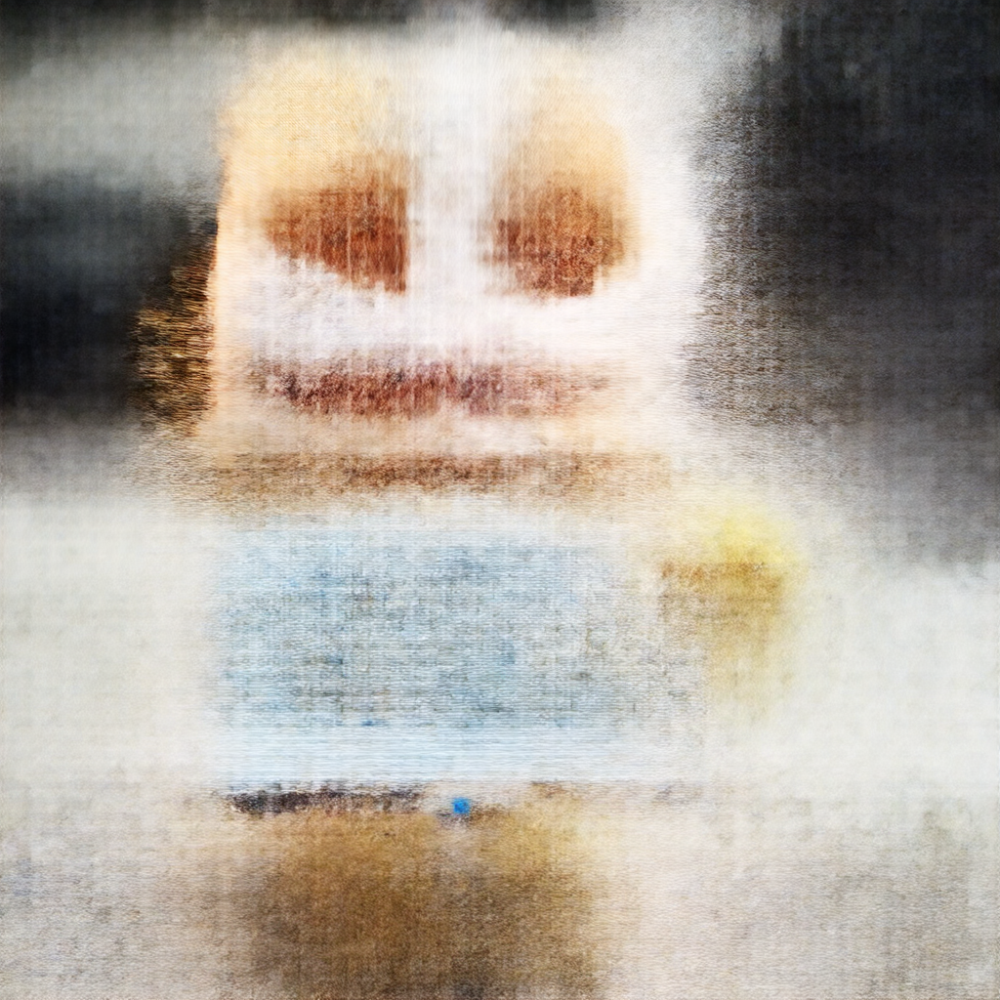

In [12]:
image

  0%|          | 0/28 [00:00<?, ?it/s]

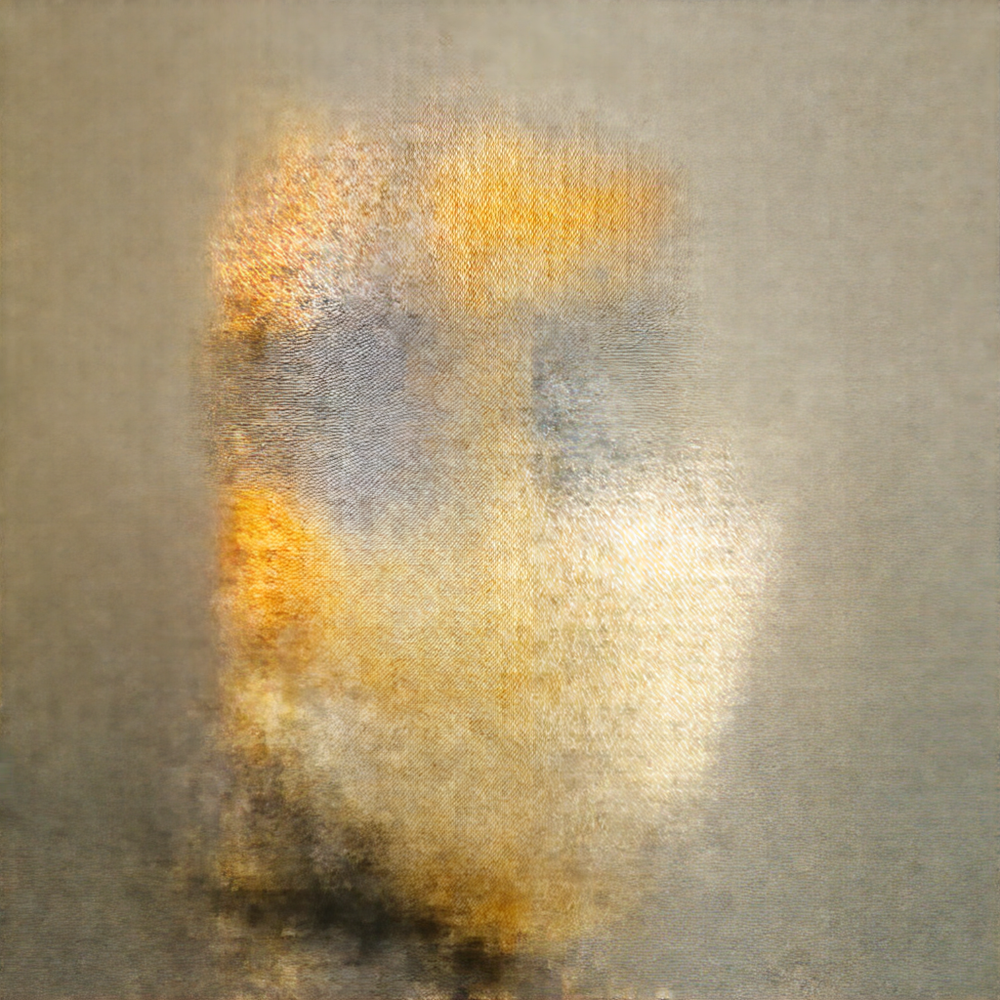

In [13]:
image = pipeline("a picture of a cat").images[0]
image

  0%|          | 0/5 [00:00<?, ?it/s]

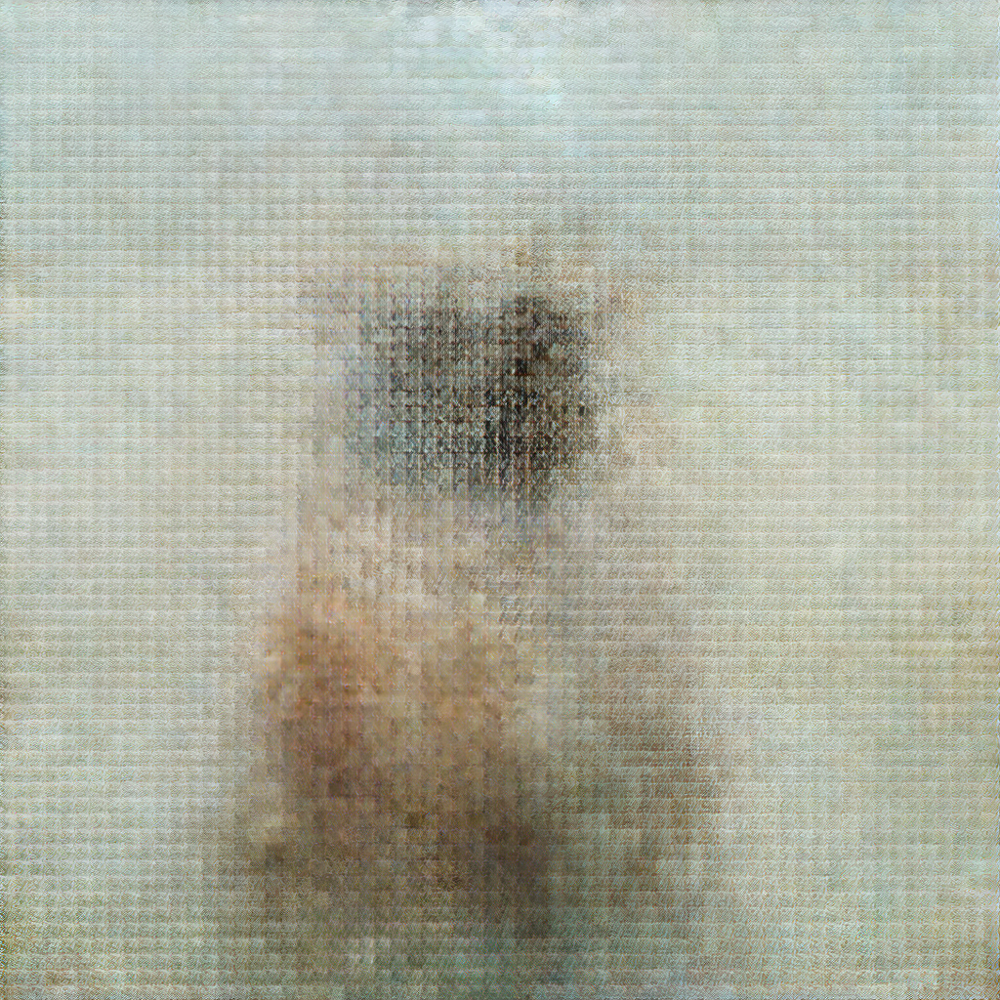

In [14]:
image = pipeline(prompt = "a picture of a cat", num_inference_steps = 5).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

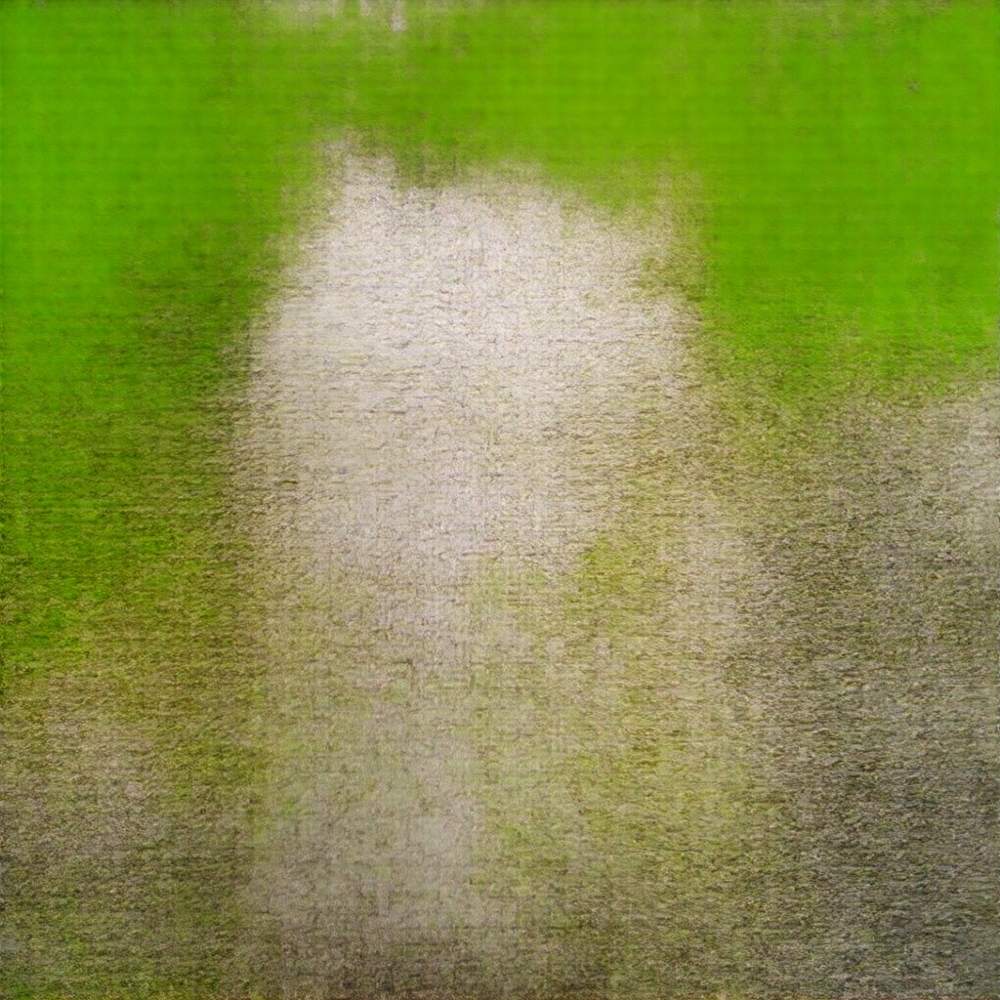

In [15]:
image = pipeline(prompt = "a picture of a catt", num_inference_steps = 50).images[0]
image

  0%|          | 0/100 [00:00<?, ?it/s]

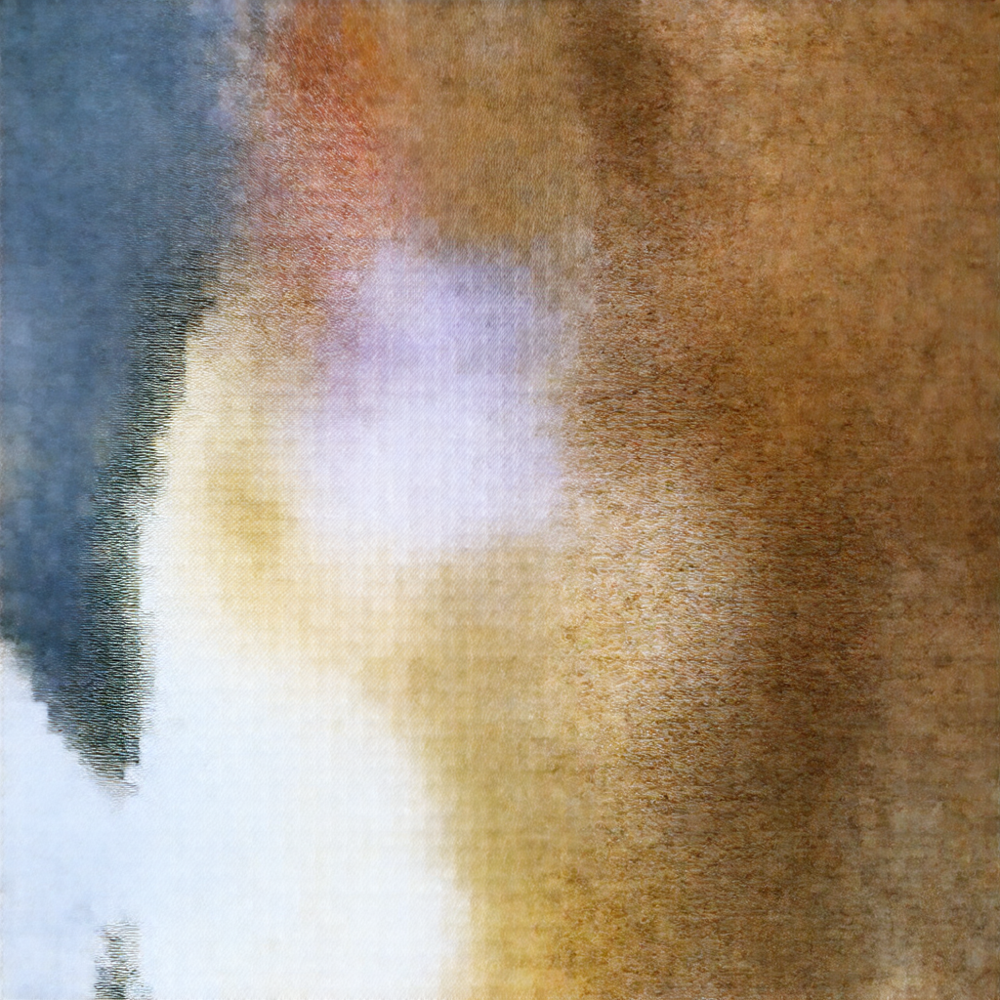

In [16]:
image = pipeline(prompt = "a picture of a cat", num_inference_steps = 100).images[0]
image